In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import random
#from PIL import Image

from astropy.cosmology import FlatLambdaCDM
import astropy.units as u

# lenstronomy module import
import lenstronomy.Util.data_util as data_util
import lenstronomy.Util.util as util
import lenstronomy.Plots.plot_util as plot_util
from lenstronomy.SimulationAPI.sim_api import SimAPI
from lenstronomy.LightModel.Profiles.gaussian import GaussianEllipse

In [2]:
DES_camera = {'read_noise': 7.,  # std of noise generated by read-out (in units of electrons)
               'pixel_scale': 0.2637,  # scale (in arcseonds) of pixels
               'ccd_gain': 4.  # electrons/ADU (analog-to-digital unit). A gain of 8 means that the camera digitizes the CCD signal so that each ADU corresponds to 8 photoelectrons.
              }
DES_g_band_obs = {'exposure_time': 90.,  # exposure time per image (in seconds)
                   'sky_brightness': 22.01,  # sky brightness (in magnitude per square arcseconds)
                   'magnitude_zero_point': 30,  # magnitude in which 1 count per second per arcsecond square is registered (in ADU's)
                   'num_exposures': 7,  # number of exposures that are combined
                   'seeing': 1.12,  # full width at half maximum of the PSF (if not specific psf_model is specified)
                   'psf_type': 'GAUSSIAN',  # string, type of PSF ('GAUSSIAN' and 'PIXEL' supported)
                   'kernel_point_source': None  # 2d numpy array, model of PSF centered with odd number of pixels per axis (optional when psf_type='PIXEL' is chosen)
                  }
numpix = 64
kwargs_g_band = util.merge_dicts(DES_camera, DES_g_band_obs)
kwargs_numerics = {'point_source_supersampling_factor': 1}
cosmo = FlatLambdaCDM(H0=70, Om0=0.3, Ob0=0.)

## Fundamental Plane Equations

If the equations of this section don't display correctly, you can use the nbviewer website: [here](https://nbviewer.jupyter.org/github/JimenaGonzalez/Simulations-Double-Source-Gravitational-Lensing/blob/master/Simulations%20Generator%20-%20DSPL%20with%20Fundamental%20Plane.ipynb).

Since we want to generate simulations that are as most realistic as posible, we must implement the relations between the parameters of the lens galaxy. The parameters of the lens are its velocity of dispersion, apparent magnitude and angular diameter. The equations implemented in this notebook are the following:

- Faber-Jackson relation: Is the relation between the luminosity L of the galaxy (in units of solar luminosity) and its velocity of dispersion \\( \sigma \\) (km/s). The equation to be fitted is:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; \\(  \log_{10}{L} = Slope * \log_{10}{\sigma} + intercept \\)

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; The values of the slope and intercept were found using a [SLAC sample](https://iopscience.iop.org/article/10.1086/589327/pdf) (table 4). [Here](https://github.com/JimenaGonzalez/Simulations-Double-Source-Gravitational-Lensing/blob/master/Faber-Jackson%20Relation.ipynb) you will find the notebook with the calculations, the values obtained were: slope = 2.24 and intercept = 5.47. That notebook also compares the performance of our fitting values with the fitting values found in [D’Onofrio, Cariddi, et al. (2017)](https://iopscience.iop.org/article/10.3847/1538-4357/aa6540/pdf) (Figure 7).

- Relation between the luminosity L of a galaxy and its absolute magnitude M, where \\( M_\odot \\) is the solar absolute magnitude:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;\\( M = M_\odot - 2.5 \log_{10}{L} \\)

- Relation between the apparent magnitude of a galaxy m and its absolute magnitude M, where k is the k-correction for the corresponding band:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;\\( m = M + DistanceModulus(z) +k \\)

- K-correction values: [Here](https://nbviewer.jupyter.org/github/rmorgan10/kcorrection/blob/master/KCorrection.ipynb) you will find a notebook with the theory of the k-correction and its calculation for a particular value of redshift and for the g bandpass. [Here](https://github.com/rmorgan10/kcorrection/blob/master/K-correction%20-%20Redshifts.ipynb) you will find a notebook with the k-correction calculation for different redshifts and optical bands.

- [Fundamental Plane Relation](https://arxiv.org/pdf/0810.4924.pdf): is the relation between the physical radius of a galaxy \\( R_e \\) (kpc), its velocity of dispersion \\( \sigma \\) (km/s) and its mean surface brightness within the half light radius \\( \mu_e \\):

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;\\( \log_{10} \left( \frac{R_e}{kpc} \right) = a \log_{10} \left( \frac{\sigma}{km/s} \right) + b \frac{\mu_e}{mags} + c \\)

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;The values of the coefficients for the different optical bands can be found in the paper referenced above.

- Definition of the mean surface brightness within the half light radius (defined in the same paper):

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;\\( \mu_e = m + 5\log_{10}(r_e) + 2.5\log_{10}(2\pi) - 10\log_{10}(1+z) \\)

- Relation between the physical radius \\( R_e \\) and the angular diameter of the galaxy \\( r_e \\), where \\( D_A \\) is the angular diameter distance:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;\\( R_e = D_A(z) \sin(r_e)  \\)

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;In this expression \\( r_e \\) is in units of radians.

The performance of all these relations is tested [here](https://github.com/JimenaGonzalez/Simulations-Double-Source-Gravitational-Lensing/blob/master/Fundamental%20Plane.ipynb). This notebook displays the distribution of luminosity and angular diameter calculated using the relations above compared to the experimental values measured for the SLAC sample.

In [3]:
#Fundamental plane relations and k-correction

def apparent_magnitude(sigma, z, k):
    #sigma = velocity of dispersion [km/s], z = redshift, k = k correction
    a, b = 2.24, 5.47 #Values found for the SLAC sample I used
    M_solar = 4.74 #Absolute magnitude of the Sun
    L = 10**(a*np.log10(sigma) + b) #Luminosity in solar units
    M = M_solar - 2.5*np.log10(L) #Absolute magnitude
    m = M + cosmo.distmod(z).value + k #Apparent magnitude
    return(m)

def angular_diameter(sigma, z, m, k):
    #m = apparent magnitude, re [Arc seconds]
    a, b, c = 1.4043, 0.3045, -8.8579 #orthogonal fit for g band
    D = cosmo.angular_diameter_distance(z).to(u.kpc).value
    first = (60*60*180*sigma**a)/(D*np.pi)
    second = (2*np.pi)**(2.5*b)/(1+z)**(10*b)
    third = 10**(b*m - b*k + c)
    re =  (first*second*third)**(1/(1-5*b))
    return(re)

def k_correction(b):
    filter_file = 'k_values/{}_passband.csv'.format(b)
    data = pd.read_csv(filter_file, names=['r', 'z', 'k'],
                           delim_whitespace=True, comment='#')
    function_kcorrection = interp1d(data['z'].values[1:], data['k'].values[1:], 
        fill_value=0.0)
    return(function_kcorrection)

In [4]:
def funcion(z_lens, z_source1, z_source2, sigma ,center_lens, center_source1, center_source2, i):
    # calculation of variables for the lens:
    band = 'g'
    k = k_correction(band)(z_lens)
    m = apparent_magnitude(sigma, z_lens, k)
    re = angular_diameter(sigma, z_lens, m, k)
    
    kwargs_model_physical = {'lens_model_list': ['SIE'],  # list of lens models to be used
                          'lens_redshift_list': [z_lens],  # list of redshift of the deflections
                          'lens_light_model_list': ['SERSIC_ELLIPSE'],  # list of unlensed light models to be used
                          'source_light_model_list': ['SERSIC_ELLIPSE', 'SERSIC'],  # list of extended source models to be used
                          'source_redshift_list': [z_source1, z_source2],  # list of redshfits of the sources in same order as source_light_model_list
                          'cosmo': cosmo,  # astropy.cosmology instance
                          'z_source': z_source2} # redshift of the default source (if not further specified by 'source_redshift_list') 
                           #and also serves as the redshift of lensed point sources}

    sim_g = SimAPI(numpix=numpix, kwargs_single_band=kwargs_g_band, kwargs_model=kwargs_model_physical)#, kwargs_numerics=kwargs_numerics)
    sim = SimAPI(numpix=numpix, kwargs_single_band=kwargs_g_band, kwargs_model=kwargs_model_physical)#, kwargs_numerics=kwargs_numerics)
    imSim = sim.image_model_class(kwargs_numerics)

    kwargs_mass = [{'sigma_v': sigma, 'center_x': center_lens[0], 'center_y': center_lens[1], 'e1': 0., 'e2': 0.}]
    kwargs_lens = sim.physical2lensing_conversion(kwargs_mass=kwargs_mass)

    #light source and lens
    kwargs_source_mag_g = [{'magnitude': 22, 'R_sersic': 0.3, 'n_sersic': 1.5, 'e1': 0., 'e2': 0., 'center_x': center_source1[0], 'center_y': center_source1[1]},
                      {'magnitude': 23, 'R_sersic': 0.3, 'n_sersic': 1.5, 'center_x': center_source2[0], 'center_y': center_source2[1]}]
    kwargs_lens_light_mag_g = [{'magnitude': m, 'R_sersic': re, 'n_sersic': 2, 'e1': 0., 'e2': 0., 'center_x': center_lens[0], 'center_y': center_lens[1]}]
    kwargs_lens_light_g, kwargs_source_g , asdf = sim_g.magnitude2amplitude(kwargs_lens_light_mag_g, kwargs_source_mag_g)
    
    image_g = imSim.image(kwargs_lens, kwargs_source_g, kwargs_lens_light_g)
    image_g += sim.noise_for_model(model=image_g)

    plt.matshow(np.log10(image_g))
    plt.savefig('Image' + str(i) + '.png')

/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in log10


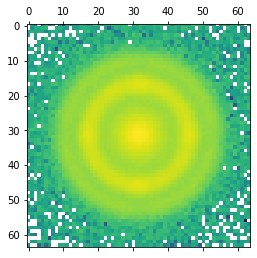

In [5]:
z_lens = .4
z_source1 = 1.
z_source2 = 3.5
dispersion = 500
center_lens = [0,0]
center_source1 = [0,0]
center_source2 = [0,0]
funcion(z_lens, z_source1, z_source2, dispersion, center_lens, center_source1, center_source2, 1)

/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in log10


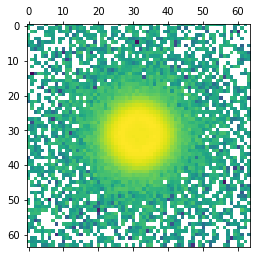

In [6]:
z_lens = .4
z_source1 = 1.
z_source2 = 3.5
dispersion = 300
center_lens = [0,0]
center_source1 = [0,0]
center_source2 = [0,0]
funcion(z_lens, z_source1, z_source2, dispersion, center_lens, center_source1, center_source2, 1)

/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in log10
/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


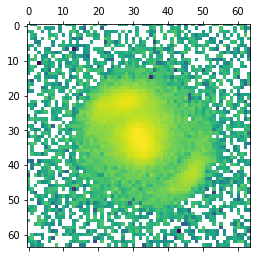

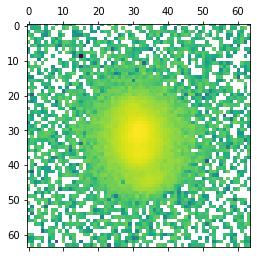

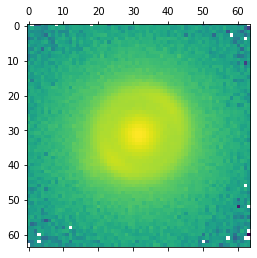

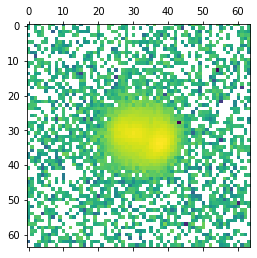

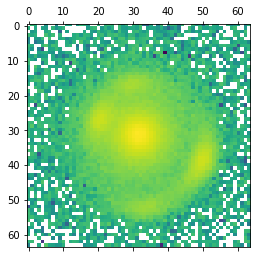

...

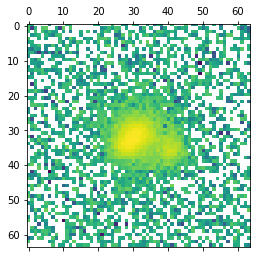

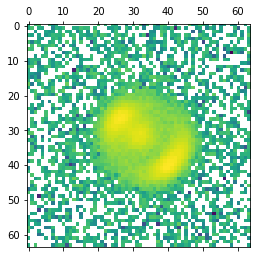

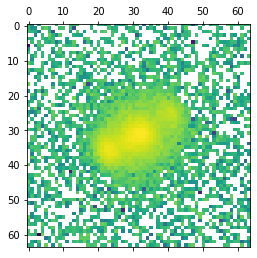

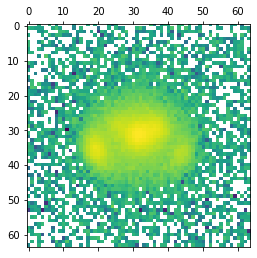

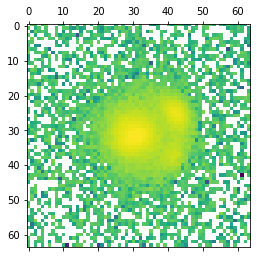

In [7]:
for i in range(0,500):
    zlens = random.uniform(0.2,1.)
    zsource1 = random.uniform(zlens, 2.7)
    zsource2 = random.uniform(zsource1, 3.9)
    dispersion = random.uniform(300, 500)
    center_source1 = [random.uniform(-1, 1), random.uniform(-1, 1)]
    center_source2 = [random.uniform(-1, 1), random.uniform(-1, 1)]
    funcion(zlens, zsource1, zsource2, dispersion, center_lens, center_source1, center_source2, i)

In [8]:
! convert -delay 50 -loop 0 *.png Animacion.gif
! rm *.png